In [287]:
from PIL import Image
import matplotlib.pyplot as plt
import cv2 as cv
import numpy as np

filename = 'scissor_original.png'

with Image.open(filename) as img:
    img.load()

filename = 'red_original.png'

with Image.open(filename) as img1:
    img1.load()

filename = 'tissue_original.png'

with Image.open(filename) as img2:
    img2.load()

filename = 'green_original.png'

with Image.open(filename) as img3:
    img3.load()

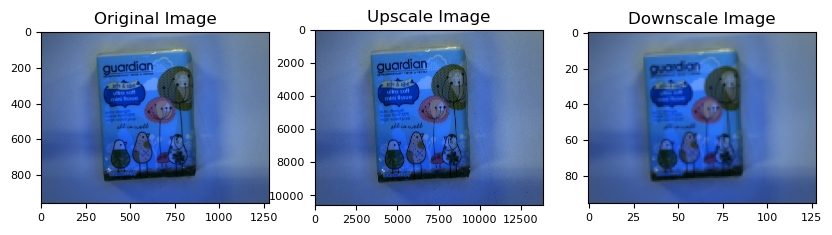

In [262]:
#Resize Image
# cropped_img = img2.crop((200, 70, 1000, 900))
# print(cropped_img.size)
# print()

resized_image_downscale = img2.resize((128,96))
resized_image_upscale = img2.resize((13800, 10600))

# Display the original and color corrected images
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(img2)
plt.tick_params(axis='both', which='major', labelsize=8)

plt.subplot(1, 3, 2)
plt.title('Upscale Image')
plt.imshow(resized_image_upscale)
plt.tick_params(axis='both', which='major', labelsize=8)

plt.subplot(1, 3, 3)
plt.title('Downscale Image')
plt.imshow(resized_image_downscale)
plt.tick_params(axis='both', which='major', labelsize=8)

plt.show()

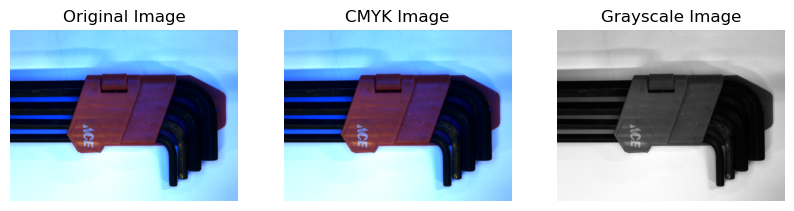

In [186]:
#Colour-space conversion
cmyk_img = img1.convert("CMYK")
gray_img = img1.convert("L")  # Grayscale

# Display the original and color corrected images
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(img1)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('CMYK Image')
plt.imshow(cmyk_img)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Grayscale Image')
plt.imshow(gray_img, cmap = "gray")
plt.axis('off')

plt.show()

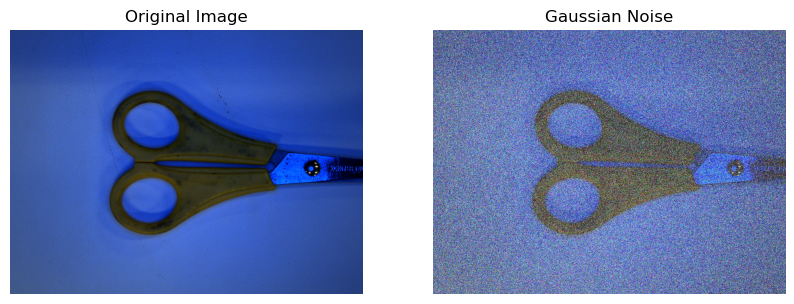

In [300]:
#Add Gaussian Noise
import numpy as np

def add_gaussian_noise(image, mean=0, std=25):
    """
    Add Gaussian noise to an image.
    
    Parameters:
    - image (PIL.Image): The input image.
    - mean (float): The mean of the Gaussian noise.
    - std (float): The standard deviation of the Gaussian noise.
    
    Returns:
    - noisy_image (PIL.Image): The output image with Gaussian noise added.
    """
    # Convert image to numpy array
    image_array = np.asarray(image)
    
    # Generate Gaussian noise
    noise = np.random.normal(mean, std, image_array.shape)
    
    # Add noise to the image
    noisy_image_array = image_array + noise
    
    # Clip values to be in the valid range
    noisy_image_array = np.clip(noisy_image_array, 0, 255).astype(np.uint8)
    
    # Convert back to PIL image
    noisy_image = Image.fromarray(noisy_image_array)
    
    return noisy_image

# # Load an image
# image_path = 'path_to_your_image.jpg'  # Replace with the path to your image
# image = Image.open(image_path).convert('RGB')

# Add Gaussian noise
noisy_image = add_gaussian_noise(img,0,100)
noisy_image.show()
# Display the original and noisy images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(img)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Gaussian Noise')
plt.imshow(noisy_image)
plt.axis('off')

plt.show()


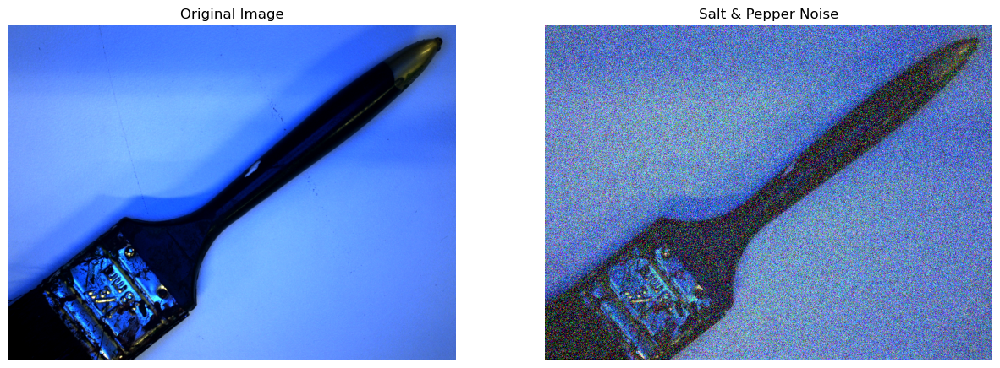

In [299]:
#Add Salt&Pepper Noise

def add_salt_and_pepper_noise(image, salt_prob=0.01, pepper_prob=0.01):
    """
    Add salt and pepper noise to an image.
    
    Parameters:
    - image (PIL.Image): The input image.
    - salt_prob (float): Probability of adding salt (white) noise.
    - pepper_prob (float): Probability of adding pepper (black) noise.
    
    Returns:
    - noisy_image (PIL.Image): The output image with salt and pepper noise added.
    """
    # Convert image to numpy array
    image_array = np.asarray(image)
    
    # Generate random noise
    noisy_image_array = image_array.copy()
    
    # Salt noise
    num_salt = np.ceil(salt_prob * image_array.size)
    coords = [np.random.randint(0, i - 1, int(num_salt)) for i in image_array.shape]
    noisy_image_array[tuple(coords)] = 255
    
    # Pepper noise
    num_pepper = np.ceil(pepper_prob * image_array.size)
    coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in image_array.shape]
    noisy_image_array[tuple(coords)] = 0
    
    # Convert back to PIL image
    noisy_image = Image.fromarray(noisy_image_array.astype(np.uint8))
    
    return noisy_image

# Add salt and pepper noise
noisy_image = add_salt_and_pepper_noise(img3, salt_prob=0.20, pepper_prob=0.20)
noisy_image.show()
# Display the original and noisy images
plt.figure(figsize=(15, 10))

plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(img3)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Salt & Pepper Noise')
plt.imshow(noisy_image)
plt.axis('off')

plt.show()


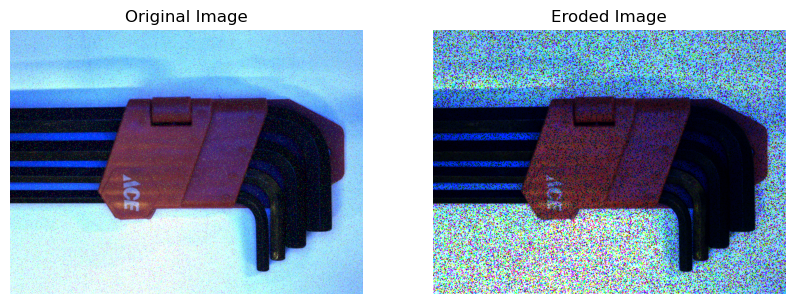

In [304]:
# effects of erosion
from PIL import ImageFilter

noisy_img = add_salt_and_pepper_noise(img1, salt_prob=0.02, pepper_prob=0.02)
erode_img =noisy_img
for _ in range(1):
     erode_img = erode_img.filter(ImageFilter.MinFilter(3))

noisy_img.show()
erode_img.show()
# Display the original and noisy images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(noisy_img)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Eroded Image')
plt.imshow(erode_img)
plt.axis('off')

plt.show()

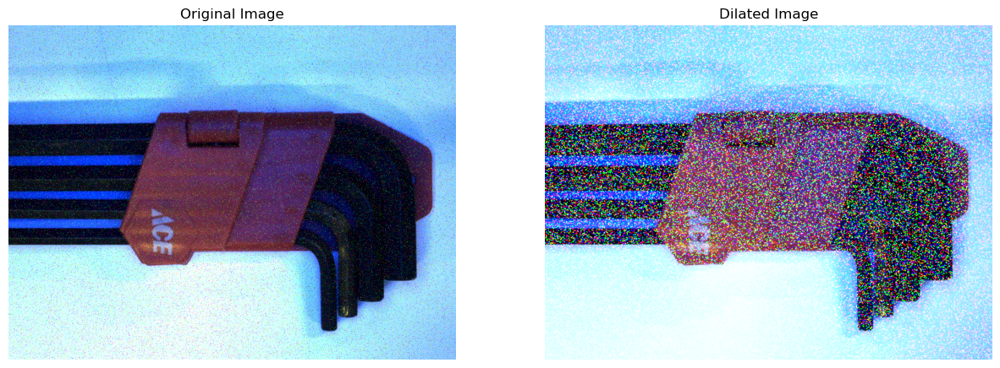

In [305]:
# dilation
noisy_img = add_salt_and_pepper_noise(img1, salt_prob=0.02, pepper_prob=0.02)
dilate_img = noisy_img
for _ in range(1):
     dilate_img = dilate_img.filter(ImageFilter.MaxFilter(3))

noisy_img.show()
dilate_img.show()
# Display the original and noisy images
plt.figure(figsize=(15,10))

plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(noisy_img)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Dilated Image')
plt.imshow(dilate_img)
plt.axis('off')

plt.show()

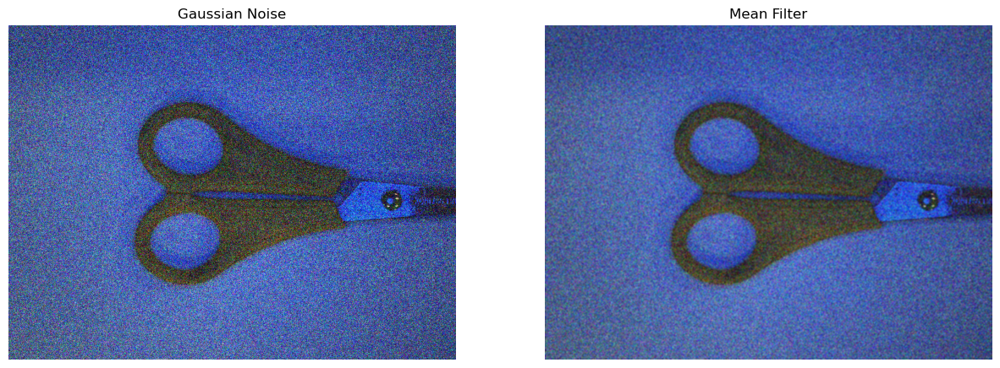

In [306]:
# Mean filter with gaussian noise
img = cv.imread('scissor_original.png')
img = cv.cvtColor(img,cv.COLOR_BGR2RGB)
assert img is not None, "file could not be read, check with os.path.exists()"

def cv_add_gaussian_noise(image, mean=0, std=25):
    noise = np.random.normal(mean, std, image.shape).astype(np.int16)
    noisy_image = image.astype(np.int16) + noise
    noisy_image = np.clip(noisy_image, 0, 255).astype(np.uint8)
    return noisy_image

noisy_image = cv_add_gaussian_noise(img, 0, 100)
blur = cv.blur(noisy_image,(5,5))

# Display the original and noisy images
plt.figure(figsize=(15,10))

# plt.subplot(1, 3, 1)
# plt.title('Original Image')
# plt.imshow(img)
# plt.axis('off')

plt.subplot(1, 2, 1)
plt.title('Gaussian Noise')
plt.imshow(noisy_image)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Mean Filter')
plt.imshow(blur)
plt.axis('off')

plt.show()

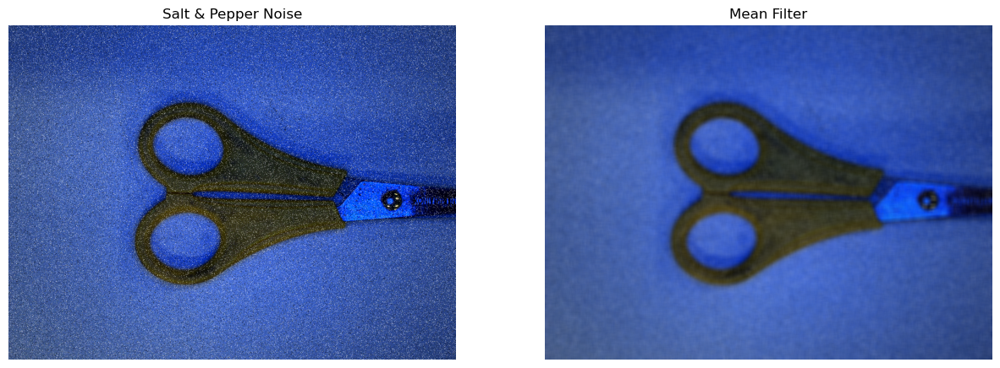

In [226]:
# Mean filter with salt & pepper noise
img = cv.imread('scissor_original.png')
img = cv.cvtColor(img,cv.COLOR_BGR2RGB)
assert img is not None, "file could not be read, check with os.path.exists()"

def cv_add_salt_and_pepper_noise(image, noise_ratio=0.02):
    noisy_image = image.copy()
    h, w, c = noisy_image.shape
    noisy_pixels = int(h * w * noise_ratio)
 
    for _ in range(noisy_pixels):
        row, col = np.random.randint(0, h), np.random.randint(0, w)
        if np.random.rand() < 0.5:
            noisy_image[row, col] = [0, 0, 0] 
        else:
            noisy_image[row, col] = [255, 255, 255]
 
    return noisy_image

noisy_image = cv_add_salt_and_pepper_noise(img, noise_ratio=0.10)
blur = cv.blur(noisy_image,(15,15))

# Display the original and noisy images
plt.figure(figsize=(15,10))

# plt.subplot(1, 3, 1)
# plt.title('Original Image')
# plt.imshow(img)
# plt.axis('off')

plt.subplot(1, 2, 1)
plt.title('Salt & Pepper Noise')
plt.imshow(noisy_image)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Mean Filter')
plt.imshow(blur)
plt.axis('off')

plt.show()

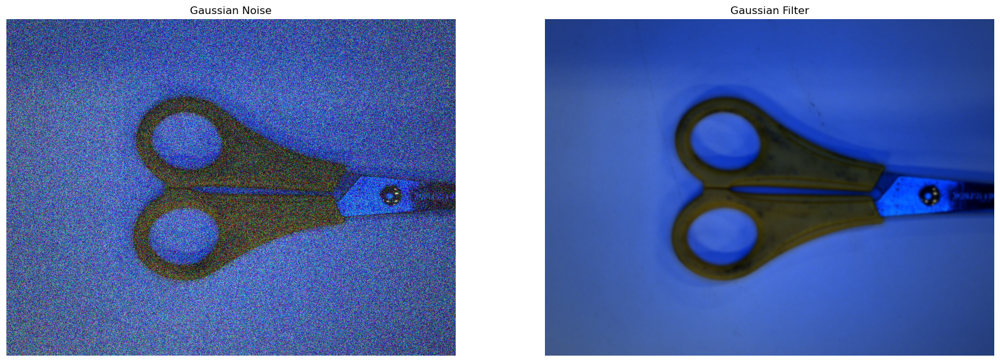

In [232]:
# Gaussuan filter with gaussian noise

img = cv.imread('scissor_original.png')
img = cv.cvtColor(img,cv.COLOR_BGR2RGB)
assert img is not None, "file could not be read, check with os.path.exists()"

def cv_add_gaussian_noise(image, mean=0, std=25):
    noise = np.random.normal(mean, std, image.shape).astype(np.int16)
    noisy_image = image.astype(np.int16) + noise
    noisy_image = np.clip(noisy_image, 0, 255).astype(np.uint8)
    return noisy_image

noisy_image = cv_add_gaussian_noise(img, 0, 100)
blur = cv.GaussianBlur(img,(15,15),0)

# Display the original and noisy images
plt.figure(figsize=(20,15))

# plt.subplot(1, 3, 1)
# plt.title('Original Image')
# plt.imshow(img)
# plt.axis('off')

plt.subplot(1, 2, 1)
plt.title('Gaussian Noise')
plt.imshow(noisy_image)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Gaussian Filter')
plt.imshow(blur)
plt.axis('off')

plt.show()

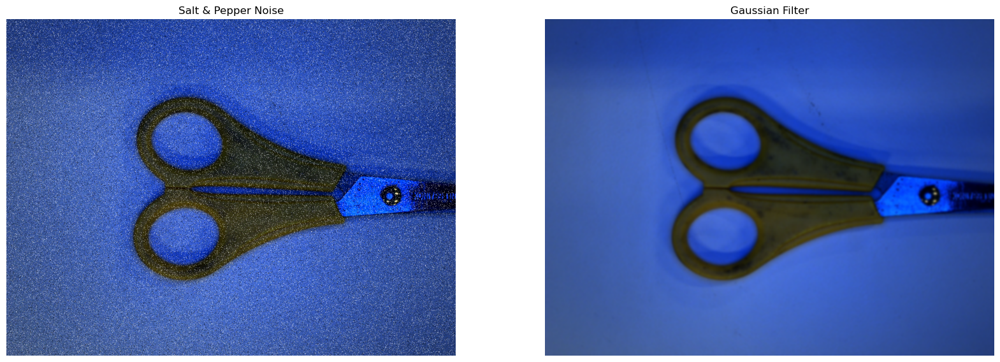

In [233]:
# Gaussuan filter with salt&pepper noise
img = cv.imread('scissor_original.png')
img = cv.cvtColor(img,cv.COLOR_BGR2RGB)
assert img is not None, "file could not be read, check with os.path.exists()"

def cv_add_salt_and_pepper_noise(image, noise_ratio=0.02):
    noisy_image = image.copy()
    h, w, c = noisy_image.shape
    noisy_pixels = int(h * w * noise_ratio)
 
    for _ in range(noisy_pixels):
        row, col = np.random.randint(0, h), np.random.randint(0, w)
        if np.random.rand() < 0.5:
            noisy_image[row, col] = [0, 0, 0] 
        else:
            noisy_image[row, col] = [255, 255, 255]
 
    return noisy_image

noisy_image = cv_add_salt_and_pepper_noise(img, noise_ratio=0.10)
blur = cv.GaussianBlur(img,(15,15),0)

# Display the original and noisy images
plt.figure(figsize=(20,15))

# plt.subplot(1, 3, 1)
# plt.title('Original Image')
# plt.imshow(img)
# plt.axis('off')

plt.subplot(1, 2, 1)
plt.title('Salt & Pepper Noise')
plt.imshow(noisy_image)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Gaussian Filter')
plt.imshow(blur)
plt.axis('off')

plt.show()

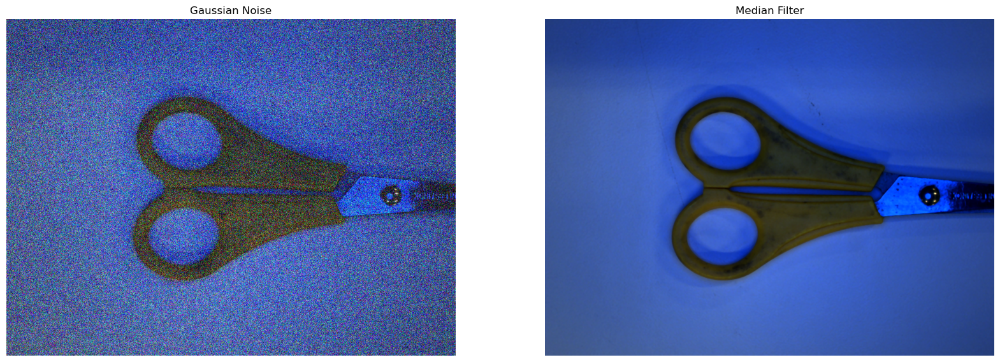

In [228]:
# Median filter with gaussian noise

img = cv.imread('scissor_original.png')
img = cv.cvtColor(img,cv.COLOR_BGR2RGB)
assert img is not None, "file could not be read, check with os.path.exists()"

def cv_add_gaussian_noise(image, mean=0, std=25):
    noise = np.random.normal(mean, std, image.shape).astype(np.int16)
    noisy_image = image.astype(np.int16) + noise
    noisy_image = np.clip(noisy_image, 0, 255).astype(np.uint8)
    return noisy_image

noisy_image = cv_add_gaussian_noise(img, 0, 100)
median = cv.medianBlur(img,5)

# Display the original and noisy images
plt.figure(figsize=(20,15))

# plt.subplot(1, 3, 1)
# plt.title('Original Image')
# plt.imshow(img)
# plt.axis('off')

plt.subplot(1, 2, 1)
plt.title('Gaussian Noise')
plt.imshow(noisy_image)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Median Filter')
plt.imshow(median)
plt.axis('off')

plt.show()

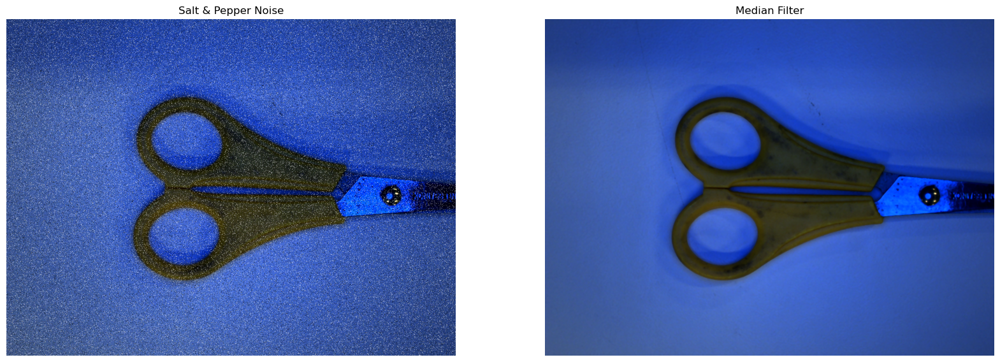

In [234]:
# Median filter with salt&pepper noise
img = cv.imread('scissor_original.png')
img = cv.cvtColor(img,cv.COLOR_BGR2RGB)
assert img is not None, "file could not be read, check with os.path.exists()"

def cv_add_salt_and_pepper_noise(image, noise_ratio=0.02):
    noisy_image = image.copy()
    h, w, c = noisy_image.shape
    noisy_pixels = int(h * w * noise_ratio)
 
    for _ in range(noisy_pixels):
        row, col = np.random.randint(0, h), np.random.randint(0, w)
        if np.random.rand() < 0.5:
            noisy_image[row, col] = [0, 0, 0] 
        else:
            noisy_image[row, col] = [255, 255, 255]
 
    return noisy_image

noisy_image = cv_add_salt_and_pepper_noise(img, noise_ratio=0.10)
median = cv.medianBlur(img,5)

# Display the original and noisy images
plt.figure(figsize=(20,15))

# plt.subplot(1, 3, 1)
# plt.title('Original Image')
# plt.imshow(img)
# plt.axis('off')

plt.subplot(1, 2, 1)
plt.title('Salt & Pepper Noise')
plt.imshow(noisy_image)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Median Filter')
plt.imshow(median)
plt.axis('off')

plt.show()

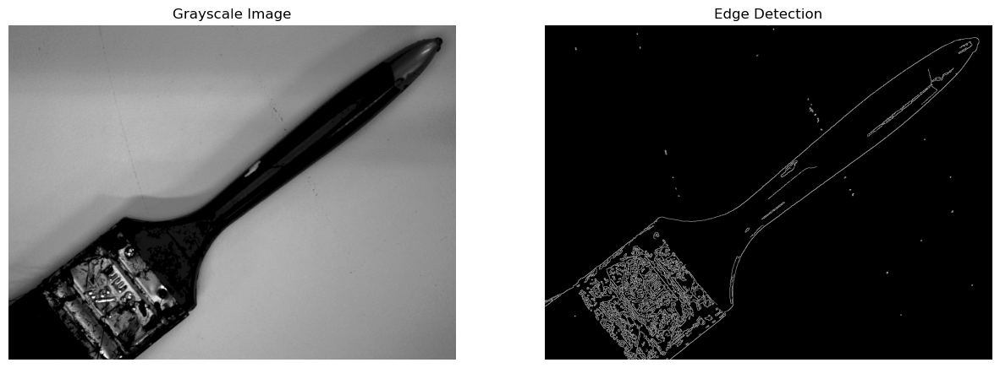

In [235]:
#edge detection algorithms
# img_gray = img.convert("L")
# img_gray_smooth = img_gray.filter(ImageFilter.SMOOTH)
# edges = img_gray.filter(ImageFilter.FIND_EDGES)
# edge_enhance = img_gray_smooth.filter(ImageFilter.EDGE_ENHANCE)
# edges.show()

img = cv.imread('green_original.png', cv.IMREAD_GRAYSCALE)
assert img is not None, "file could not be read, check with os.path.exists()"
edges = cv.Canny(img,60,160)
 
# plt.subplot(121),plt.imshow(img,cmap = 'gray')
# plt.title('Original Image'), plt.xticks([]), plt.yticks([])
# plt.subplot(122),plt.imshow(edges,cmap = 'gray')
# plt.title('Edge Image'), plt.xticks([]), plt.yticks([])

# Display the original and noisy images
plt.figure(figsize=(15,10))

plt.subplot(1, 2, 1)
plt.title('Grayscale Image')
plt.imshow(img, cmap = 'gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Edge Detection')
plt.imshow(edges, cmap = 'gray')
plt.axis('off')

plt.show()

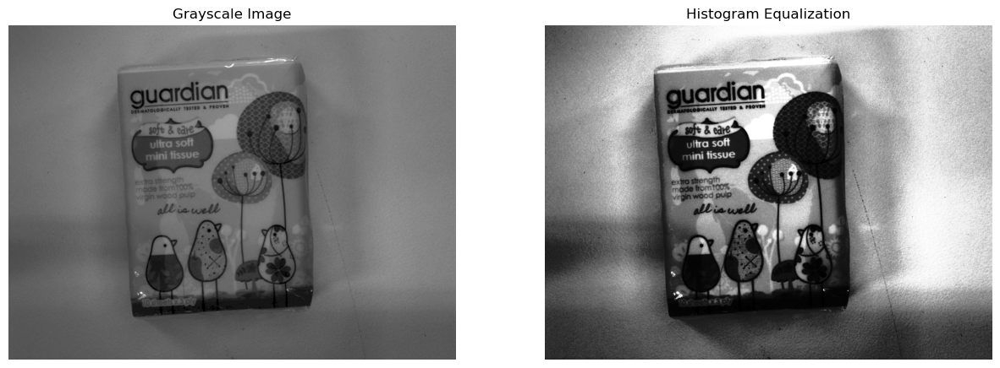

In [340]:
# histogram equalization
import cv2 as cv
 
img = cv.imread('tissue_original.png', cv.IMREAD_GRAYSCALE)
assert img is not None, "file could not be read, check with os.path.exists()"
equ = cv.equalizeHist(img)
# res = np.hstack((img,equ)) #stacking images side-by-side

# Display the original and noisy images
plt.figure(figsize=(15,10))

plt.subplot(1, 2, 1)
plt.title('Grayscale Image')
plt.imshow(img, cmap = "gray")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Histogram Equalization')
plt.imshow(equ, cmap = "gray")
plt.axis('off')

plt.show()

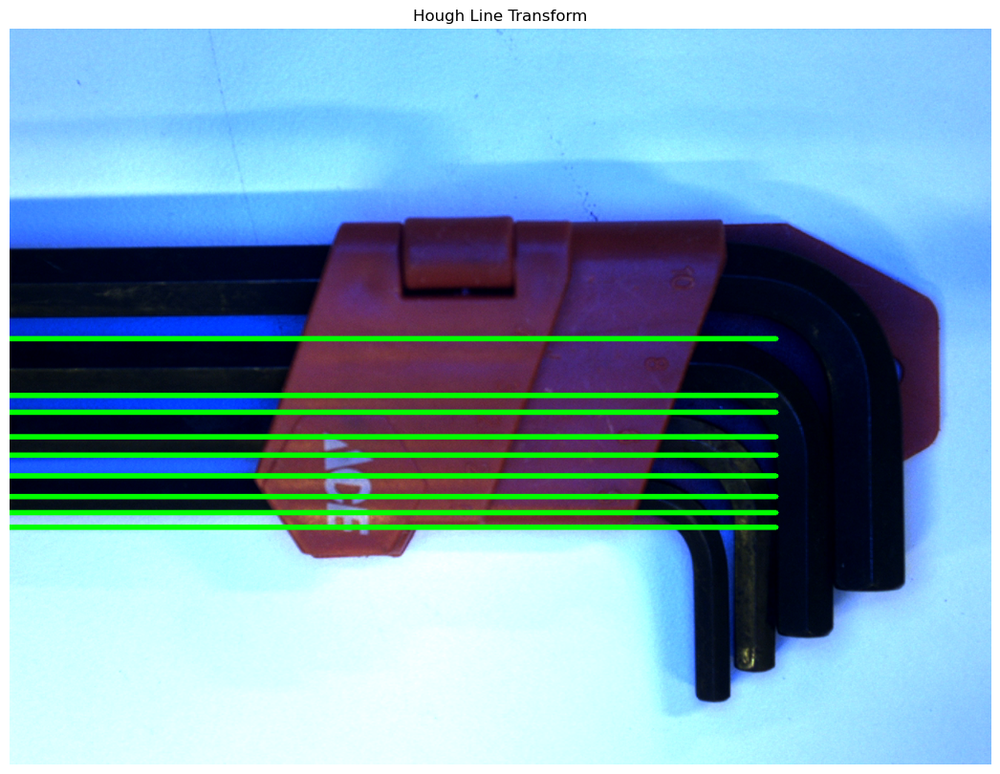

In [244]:
# Hough transforms (Line)
img = cv.imread(cv.samples.findFile('red_original.png'))
rgb = cv.cvtColor(img,cv.COLOR_BGR2RGB)
gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
edges = cv.Canny(gray,50,100,apertureSize = 3)
 
lines = cv.HoughLines(edges,1,np.pi/180,200)
for line in lines:
 rho,theta = line[0]
 a = np.cos(theta)
 b = np.sin(theta)
 x0 = a*rho
 y0 = b*rho
 x1 = int(x0 + 1000*(-b))
 y1 = int(y0 + 1000*(a))
 x2 = int(x0 - 1000*(-b))
 y2 = int(y0 - 1000*(a))
 
 cv.line(rgb,(x1,y1),(x2,y2),(0,255,0),5)

# plt.subplot(111),plt.imshow(rgb, cmap = "gray")
# plt.title('Original Image'), plt.xticks([]), plt.yticks([])

# Display the original and noisy images
plt.figure(figsize=(15,10))

plt.subplot(1, 1, 1)
plt.title('Hough Line Transform')
plt.imshow(rgb)
plt.axis('off')

plt.show()
 

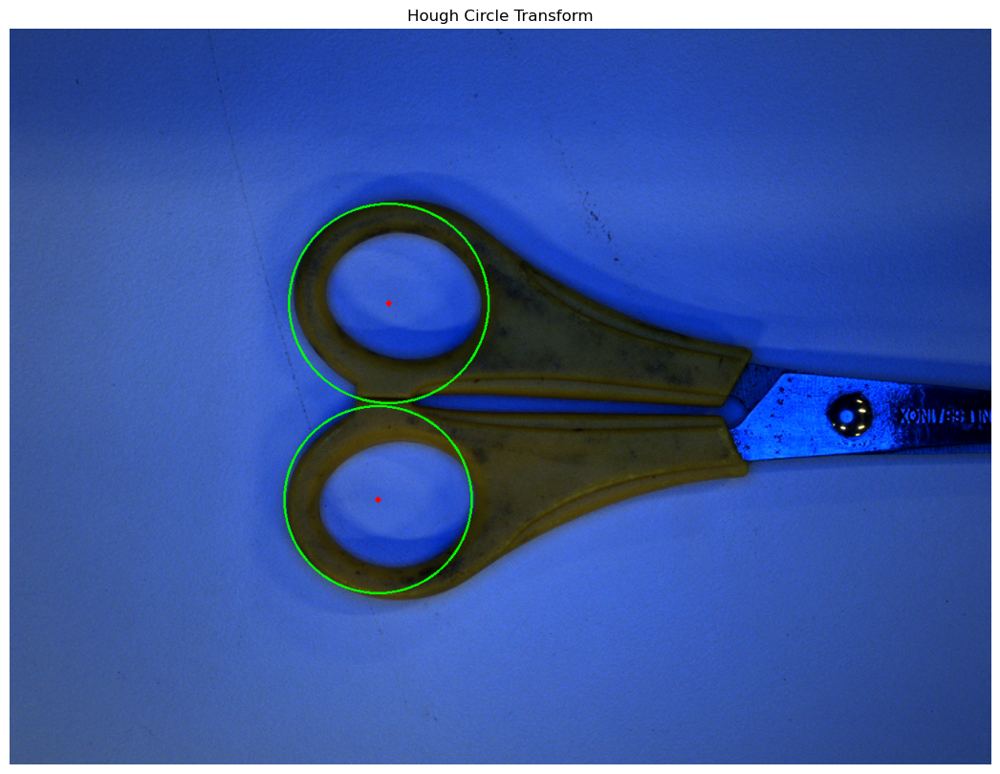

In [335]:
# Hough Transforms (Circle)
import numpy as np
import cv2 as cv
 
img = cv.imread('scissor_original.png')
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
gray_img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
assert img is not None, "file could not be read, check with os.path.exists()"
img = cv.medianBlur(img_rgb,5)
cimg = cv.cvtColor(img_rgb,cv.COLOR_RGB2BGR)
 
circles = cv.HoughCircles(gray_img,cv.HOUGH_GRADIENT,1,20,
 param1=120,param2=42,minRadius=60,maxRadius=0)
 
circles = np.uint16(np.around(circles))
for i in circles[0,:]:
 # draw the outer circle
 cv.circle(cimg,(i[0],i[1]),i[2],(0,255,0),2)
 # draw the center of the circle
 cv.circle(cimg,(i[0],i[1]),2,(0,0,255),3)
 
# cv.imshow('detected circles',cimg)
# cv.waitKey(0)
# cv.destroyAllWindows()

cimg_rgb = cv.cvtColor(cimg, cv.COLOR_BGR2RGB)

# Display the original and noisy images
plt.figure(figsize=(15,10))

plt.subplot(1, 1, 1)
plt.title('Hough Circle Transform')
plt.imshow(cimg_rgb)
plt.axis('off')

plt.show()



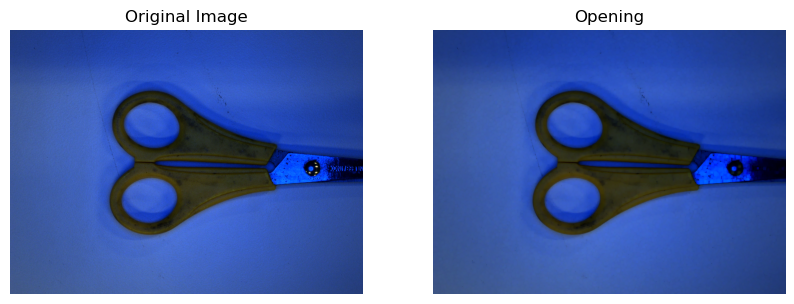

In [250]:
# morphological operations
# Opening

# Load an image
image_path = 'scissor_original.png'  # Replace with the path to your image
img = cv.imread(image_path, cv.IMREAD_COLOR)  # Load the image in color

# Convert to grayscale if needed
gray_img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

#Convert RGB
rgb = cv.cvtColor(img,cv.COLOR_BGR2RGB)

# Create a kernel
kernel = np.ones((3, 3), np.uint8)

# Apply morphological opening
opening = cv.morphologyEx(rgb, cv.MORPH_OPEN, kernel, iterations= 3)

# Display the images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))  # Convert BGR to RGB for displaying
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Opening')
plt.imshow(opening, cmap='gray')
plt.axis('off')

plt.show()

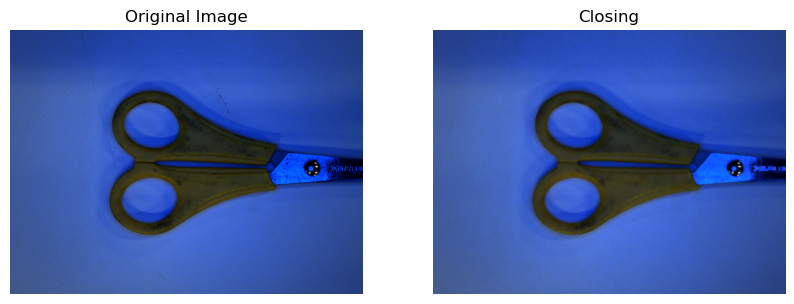

In [251]:
# Closing

# Load an image
image_path = 'scissor_original.png'  # Replace with the path to your image
img = cv.imread(image_path, cv.IMREAD_COLOR)  # Load the image in color

# Convert to grayscale if needed
gray_img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

#Convert RGB
rgb = cv.cvtColor(img,cv.COLOR_BGR2RGB)

# Create a kernel
kernel = np.ones((3, 3), np.uint8)

# Apply morphological opening
closing = cv.morphologyEx(rgb, cv.MORPH_CLOSE, kernel, iterations = 3)

# Display the images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))  # Convert BGR to RGB for displaying
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Closing')
plt.imshow(closing, cmap='gray')
plt.axis('off')

plt.show()

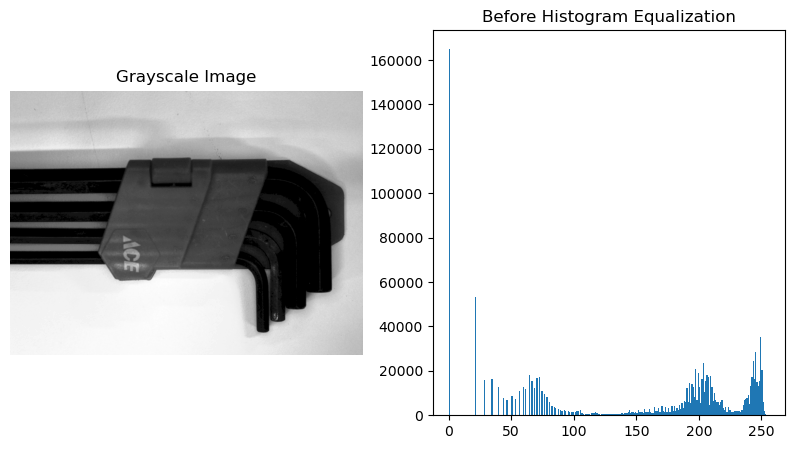

In [338]:
# histogram comparison
#before equalization
img = cv.imread('red_original.png', cv.IMREAD_GRAYSCALE)
assert img is not None, "file could not be read, check with os.path.exists()"

hist = cv.calcHist([img],[0],None,[256],[0,256])
# plt.hist(img.ravel(),256,[0,256])
# plt.show()

# Display the images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title('Grayscale Image')
plt.imshow(img, cmap = 'gray')  # Convert BGR to RGB for displaying
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Before Histogram Equalization')
plt.hist(img.ravel(),256,[0,256])

plt.show()

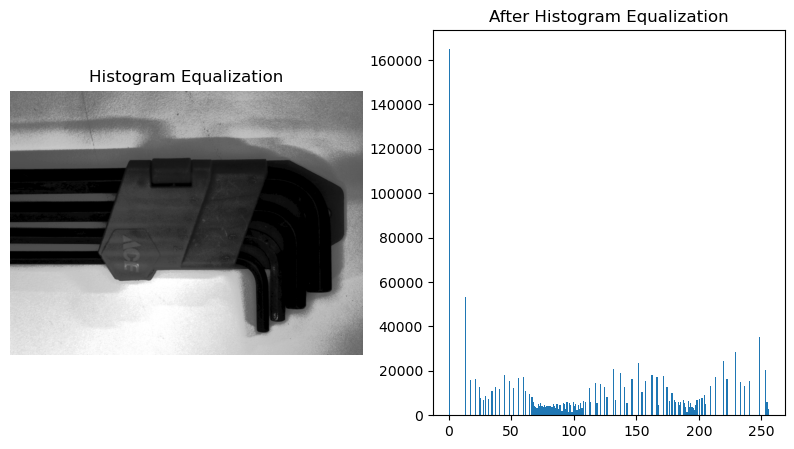

In [339]:
# after equalization
equ = cv.equalizeHist(img)

hist = cv.calcHist([equ],[0],None,[256],[0,256])
# Display the images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title('Histogram Equalization')
plt.imshow(equ, cmap = 'gray')  # Convert BGR to RGB for displaying
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('After Histogram Equalization')
plt.hist(equ.ravel(),256,[0,256])

plt.show()

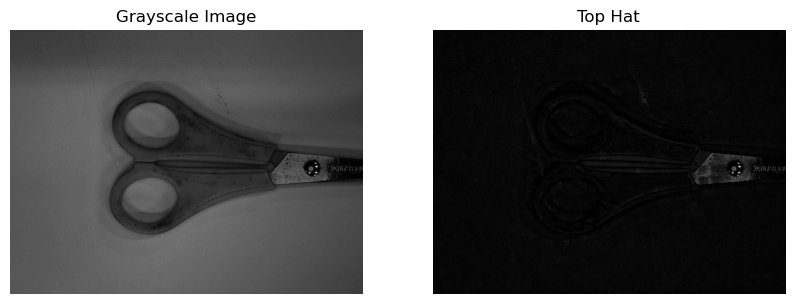

In [253]:
# Top Hat

# Load an image
image_path = 'scissor_original.png'  # Replace with the path to your image
img = cv.imread(image_path, cv.IMREAD_COLOR)  # Load the image in color

# Convert to grayscale if needed
gray_img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

#Convert RGB
rgb = cv.cvtColor(img,cv.COLOR_BGR2RGB)

# Create a kernel
kernel = np.ones((3, 3), np.uint8)

tophat = cv.morphologyEx(gray_img, cv.MORPH_TOPHAT, kernel, iterations = 10)

# Display the images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title('Grayscale Image')
plt.imshow(gray_img, cmap='gray')  # Convert BGR to RGB for displaying
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Top Hat')
plt.imshow(tophat, cmap = 'gray')
plt.axis('off')

plt.show()

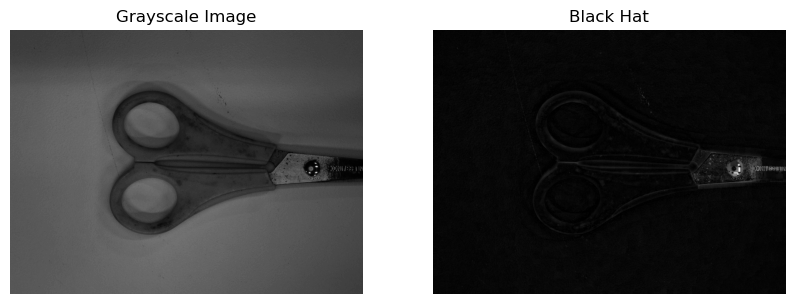

In [254]:
# Black Hat

# Load an image
image_path = 'scissor_original.png'  # Replace with the path to your image
img = cv.imread(image_path, cv.IMREAD_COLOR)  # Load the image in color

# Convert to grayscale if needed
gray_img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

#Convert RGB
rgb = cv.cvtColor(img,cv.COLOR_BGR2RGB)

# Create a kernel
kernel = np.ones((3, 3), np.uint8)

blackhat = cv.morphologyEx(gray_img, cv.MORPH_BLACKHAT, kernel, iterations = 10)

# Display the images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title('Grayscale Image')
plt.imshow(gray_img, cmap = 'gray')  # Convert BGR to RGB for displaying
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Black Hat')
plt.imshow(blackhat, cmap = 'gray')
plt.axis('off')

plt.show()